* Imports 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from IPython.display import Image

In [2]:
df = pd.read_csv('./datasets/eda_df.csv', index_col = 0)

# Areas of attack

**A plot of all attack points in the dataset**

In [3]:
df.country.value_counts()[:10]

international waters    1280
indonesia                621
bangladesh               210
malaysia                 196
philippines              182
nigeria                  130
peru                      80
colombia                  80
vietnam                   74
yemen                     73
Name: country, dtype: int64

In [4]:
m = folium.Map(zoom_start = 100)
df.apply(lambda x: folium.CircleMarker(location = (x['Y'], x['X']), 
                                       radius = 1, 
                                       opacity = .5).add_to(m), axis = 1)
m

#https://www.kaggle.com/subinium/how-to-use-folium-geospatial-data

Pirate attacks are mainly distrubuted around the equator. There are high concentrations of attacks in the Atlantic ocean off the west coast of Africa, the Caribbean, as well in the south east asian area of the Pacific

**Pirate attacks by subregion**

[Maritime Subregions](https://irp.fas.org/world/para/docs/geol_geo.html)
**Map of Maritime Subregions**

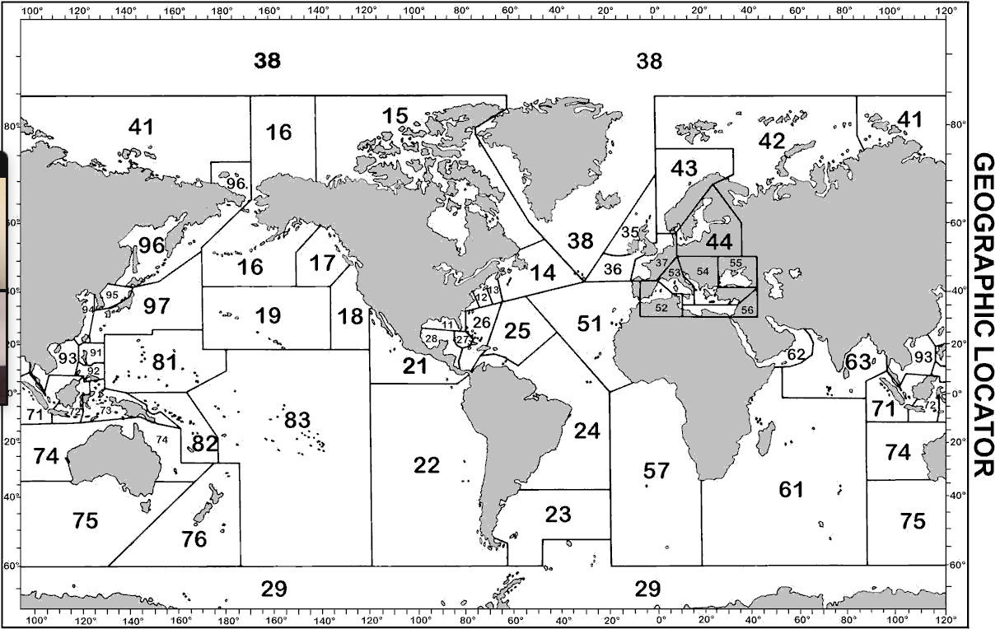

In [5]:
Image(filename = "./img/Subregions.png", width = 1000, height = 400)

What subregion sees the most pirate activity?

In [24]:
[[x,df[x].sum()] for x in df.drop(columns = ['subreg_11', 'subreg_12', 'subreg_23', 'subreg_36', 'subreg_37', 
                            'subreg_44', 'subreg_55', 'subreg_96', 'subreg_97','subreg']) if x[:6] in 'subreg']

[['subreg_13', 1],
 ['subreg_18', 1],
 ['subreg_21', 4],
 ['subreg_22', 142],
 ['subreg_24', 164],
 ['subreg_25', 74],
 ['subreg_26', 37],
 ['subreg_27', 4],
 ['subreg_28', 27],
 ['subreg_51', 55],
 ['subreg_52', 1],
 ['subreg_53', 3],
 ['subreg_54', 1],
 ['subreg_56', 27],
 ['subreg_57', 591],
 ['subreg_61', 238],
 ['subreg_62', 545],
 ['subreg_63', 511],
 ['subreg_71', 717],
 ['subreg_72', 215],
 ['subreg_73', 11],
 ['subreg_74', 1],
 ['subreg_81', 4],
 ['subreg_82', 1],
 ['subreg_83', 6],
 ['subreg_91', 96],
 ['subreg_92', 86],
 ['subreg_93', 132],
 ['subreg_94', 38],
 ['subreg_95', 4]]

Subregion 71 has the most encounters in our data base with 717. This corresponds to the Pacific South East Asia area. 

**Pirate attack success correlations by subregion**

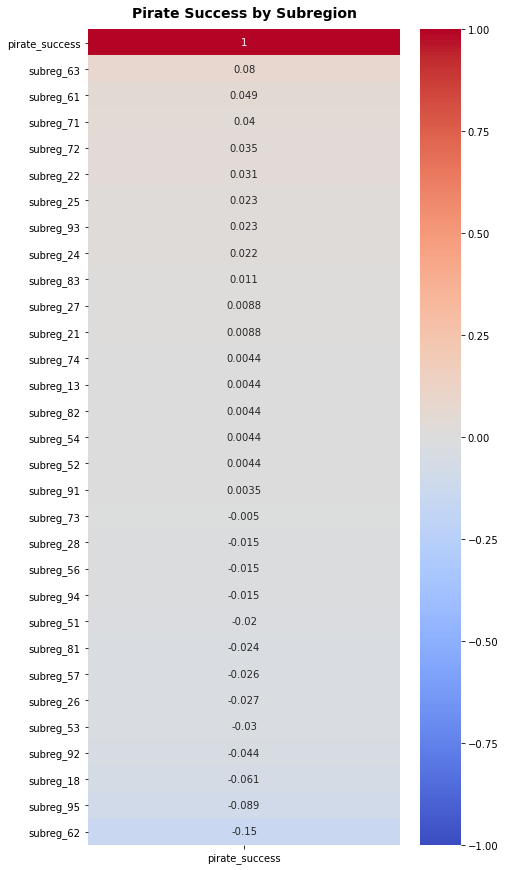

In [7]:
#Show which subregions pirates are most successfull in. 

sub_reg_cols = [x for x in df.drop(columns = ['subreg_11', 
                                              'subreg_12', 
                                              'subreg_23', 
                                              'subreg_36', 
                                              'subreg_37', 
                                              'subreg_44', 
                                              'subreg_55', 
                                              'subreg_96', 
                                              'subreg_97',
                                              'subreg']).columns if x[:6] in 'subreg' or x == 'pirate_success']

plt.figure(figsize=(7, 15))
plt.title('Pirate Success by Subregion', fontsize = 14, fontweight = 'bold', pad = 12)
sns.heatmap(df[sub_reg_cols].corr()[['pirate_success']].sort_values('pirate_success', ascending = False),
            annot=True, cmap='coolwarm', vmin=-1, vmax=1);

Pirates are have the greatest success in subregion 63, located in the Indian Ocean

# Pirate attacks over time

**Pirate attacks by year**

<Figure size 1800x360 with 0 Axes>

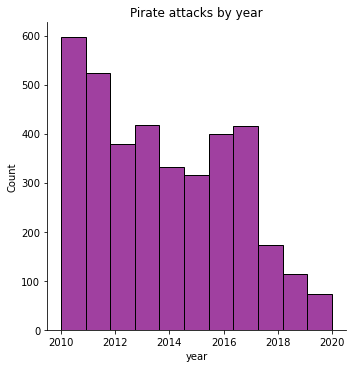

In [18]:
plt.figure(figsize = (25,5))
sns.displot(data = df, x = 'year',color = 'purple', bins = len(df['year'].value_counts())).set(title = "Pirate attacks by year");

Since 2010 pirate attacks have decreased steadily. In previous itterations of our EDA on data which included attacks from 1978 onward, it seemed that piracy was on the rise approaching 2010

**Pirate success rate by month**

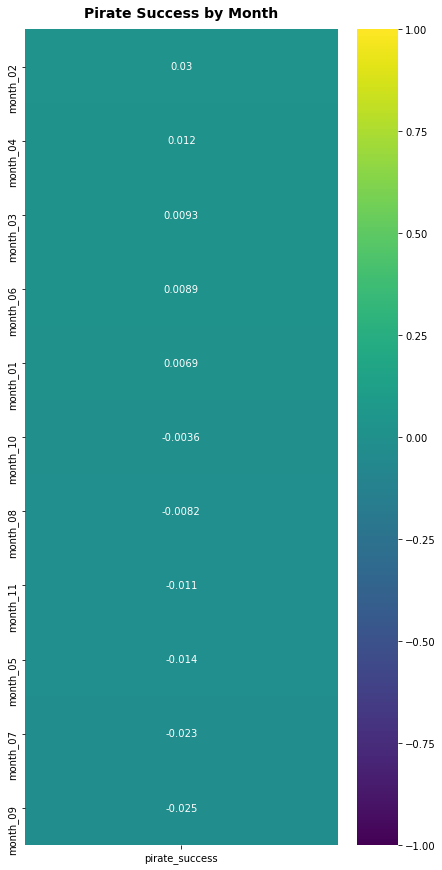

In [9]:
#Show which subregions pirates are most successfull in. 

month_names = {'month_01':'Jan' ,
              'month_02':'Feb' ,
              'month_03': 'March',
              'month_04': 'April' ,
              'month_05': 'May',
               'month_06': 'June',
               'month_07': 'July',
               'month_08': 'Aug',
               'month_09': 'Sept',
               'month_10': 'Oct',
               'month_11': 'Nov',
               'month_12': 'Dec',
              }

month_cols = [x for x in df.columns if x[:6] == 'month_' or x == 'pirate_success']

plt.figure(figsize=(7, 15))
plt.title('Pirate Success by Month', fontsize = 14, fontweight = 'bold', pad = 12)
sns.heatmap(df[month_cols].corr()[['pirate_success']][:-2].sort_values('pirate_success', ascending = False),
            annot=True, cmap='viridis', vmin=-1, vmax=1);

Pirating success does not seem to correlate with month of the year

**Distribution of pirate attacks by month**

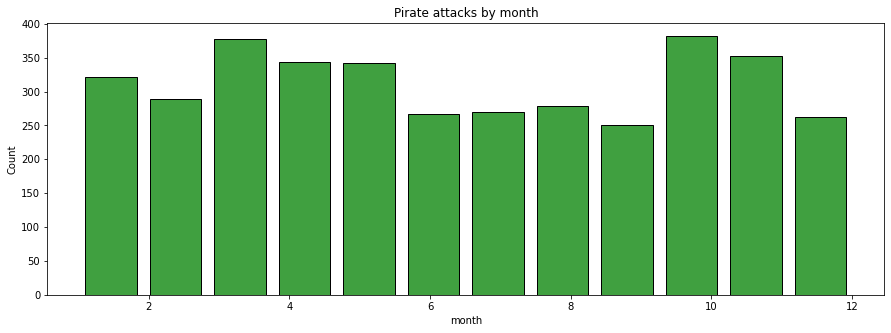

In [19]:
plt.figure(figsize = (15,5))
sns.histplot(data = df, x = 'month', shrink = .8, bins = 12, color = 'green').set(title = 'Pirate attacks by month');

Pirate attacks remain generally consistent across months. With an exception of Feburary other months don't show a vast difference. Our inital assumption when looking at the month of February is that since it's the one month that has the least amount of days, this may equate to less travel or merchant activity which leads to lower opportunites of pirate attacks. Ocotber and November and march are the highest overall. 

**Pirate attack locations over the course of 10 a year period**

In [11]:
# Attack by year ranges. This was to see if what changes in pirate activty occur over time
m = folium.Map()
for i, coord in df.iterrows():
    if coord.year <= 2013:
        folium.CircleMarker(location = (coord['Y'], coord['X']), 
                            radius = 1, 
                            color = 'red',
                            opacity = .3).add_to(m)
    elif coord.year < 2016 and coord.year > 2013:
        folium.CircleMarker(location = (coord['Y'], coord['X']), 
                            radius = 1, 
                            color = 'yellow',
                            opacity = .3).add_to(m)
    elif coord.year >= 2016:
        folium.CircleMarker(location = (coord['Y'], coord['X']), 
                            radius = 1, 
                            color = 'blue',
                            opacity = .3).add_to(m)

folium.TileLayer('Stamen Terrain').add_to(m)
m

#https://www.kaggle.com/anthaus/tuto-draw-nice-maps-with-folium
#https://deparkes.co.uk/2016/06/10/folium-map-tiles/

Attacks in the Caribbean and West African are on the rise 

# Victims

Distribution of victim types:

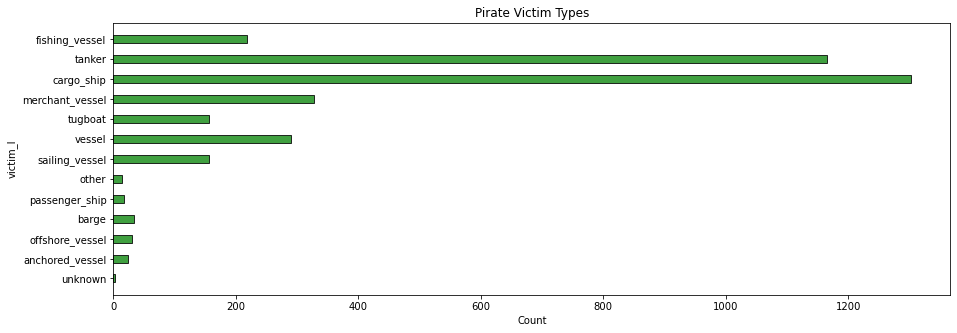

In [20]:
plt.figure(figsize = (15,5))
sns.histplot(data = df, y = 'victim_l', shrink = .4, color = 'green').set_title('Pirate Victim Types');

Tankers and cargo ships are the prefered targets. Attacks on cargo ships make sense as the cargo would be profitable. The preference for tankers is a little confusing. They could be targets based on the types of equipment they carry

**Which victim types are pirates most successfull against?**

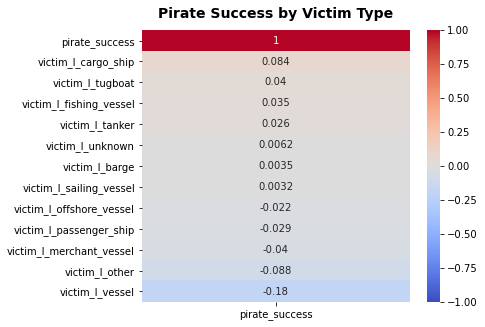

In [21]:
#Against what type of victims are pirate attacks most successful

victim_cols = [x for x in df.columns if x[:5] in 'victim_l' or x == 'pirate_success'][1:]

plt.figure(figsize=(6, 5))
plt.title('Pirate Success by Victim Type', fontsize = 14, fontweight = 'bold', pad = 12)
sns.heatmap(df[victim_cols].corr()[['pirate_success']][1:].sort_values('pirate_success', ascending = False),
            annot=True, cmap='coolwarm', vmin=-1, vmax=1);

Success when pirating cargo ships is very high

**Pirate attacks on non-commericial vessels**

In [14]:
m = folium.Map()
df[(df['victim_l_passenger_ship'] == 1) | (df['victim_l_sailing_vessel'] == 1)].apply(lambda x: folium.CircleMarker(location = (x['Y'], x['X']), radius = 1).add_to(m), axis = 1)
folium.TileLayer('CartoDB dark_matter').add_to(m)
m

#CartoDB dark_matter is used here for visibility as the points are sparse

There are a high number of attacks on non-commercial vessels in the Caribbean. This would make sense as it is a popular tourist destination.  

# Poverty

**Attacks in areas with high poverty percentage vs low poverty percentage**

In [15]:
# Attacks in areas where with high poverty percentage vs low poverty percentage
m = folium.Map(zoom_start= 2)
for i, coord in df[df['country'] != 'international waters'].iterrows():
    if coord.poverty_percentage > .4 :
        folium.CircleMarker(location = (coord['Y'], coord['X']), 
                            radius = 1, 
                            opacity = .5).add_to(m)
    elif coord.poverty_percentage  <= .4:
        folium.CircleMarker(location = (coord['Y'], coord['X']), 
                            radius = 1, 
                            color = 'orange',
                            opacity = .5).add_to(m)

folium.TileLayer('CartoDB positron').add_to(m)
m

#https://www.kaggle.com/anthaus/tuto-draw-nice-maps-with-folium
#https://deparkes.co.uk/2016/06/10/folium-map-tiles/

Most attacks occur against nations with a low poverty rating

# Sea law adoptions

In [16]:
#Sea law adoption:

m = folium.Map()
for i, coord in df[df['country'] != 'international waters'].iterrows():
    if coord.sea_law_adoption < 25:
        folium.CircleMarker(location = (coord['Y'], coord['X']), 
                            radius = 1, 
                            color = 'red',
                            opacity = .5).add_to(m)
    elif coord.sea_law_adoption < 50:
        folium.CircleMarker(location = (coord['Y'], coord['X']), 
                            radius = 1, 
                            color = 'yellow',
                            opacity = .5).add_to(m)
    elif coord.sea_law_adoption < 75:
        folium.CircleMarker(location = (coord['Y'], coord['X']), 
                            radius = 1, 
                            color = 'blue',
                            opacity = .5).add_to(m)
    else:
        folium.CircleMarker(location = (coord['Y'], coord['X']), 
                            radius = 1, 
                            color = 'green',
                            opacity = .5).add_to(m)


folium.TileLayer('CartoDB positron').add_to(m)
m

Most attacks occur in areas where adoption of sea law is low. An interesting outlier is China which has high average of adopting these laws but is still seeing cluster of attacks on its eastern central coast.

Futher exploration (pertaining to modeling) has been peformed in the modeling notebook 